# 156KS

#### ISS-placenta, figure generating notebook

This notebook investigates a spatial stranscriptomics sample from an early-stage pregnancy biopsy. Marker genes for different trophoblast phenotypes are identified from a parallel single-nucleus transcriptomics experiment. A UMAP-based model of tissue structure and morphology is used to verify, define 4 tissue classes and plot occurring spatial signal. Individual plots are created for each identified cell type.

In [1]:
%load_ext autoreload
%autoreload 2

from IPython.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))

import sys
import os
sys.path.append(os.path.join(os.path.abspath('.'),'planktonpy/plankton'))

In [2]:
import os
from PIL import Image
Image.MAX_IMAGE_PIXELS = 933120000

import numpy as np
import pandas as pd
import matplotlib
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.pyplot as plt

# from krakenpy.src import kraken as pl
import plankton as pl
import scanpy as sc

data_folder='./data'
output_folder='./output'

### Load meta data:

In [5]:
meta = pd.read_csv(os.path.join(data_folder,'meta-156KS.txt'),header=None,index_col=0).T 
meta

,sample,stage,tissue,state,panel,coordinate_file,background_file,um_p_px
1,156KS,early,villi,C,immune/placenta,coordinates_joined.csv,156KS_DAPI.tif,0.162478


### Load, normalize, subset snRNAseq AnnData:

In [6]:
snRNAseq_file = os.path.join(data_folder,'meta-156KS.txt',"SP014_SP082_SP136_placenta_annotations_250322.h5ad")

adata_raw= sc.read_h5ad(snRNAseq_file)
adata_full= adata_raw.raw.to_adata()
adata_norm=adata_full.copy()
sc.pp.normalize_total(adata_norm)
sc.pp.log1p(adata_norm)

In [7]:
subset = (adata_full.obs.disease==meta.state[1]) & \
         (adata_full.obs.time==meta.stage[1]) & \
         (adata_full.obs.tissue==meta.tissue[1])


adata = adata_full[subset]

### Load coordinates & backgrounds:

In [10]:
um_p_px = float(meta.um_p_px[1])

coordinates = pd.read_csv(os.path.join(data_folder,meta.coordinate_file.values[0]),)
coordinates.X*=um_p_px
coordinates.Y*=um_p_px

bg = Image.open(os.path.join(data_folder,meta.background_file.values[0]),) 
bg = bg.resize((bg.width//4,bg.height//4),Image.ANTIALIAS)
bg = np.array(bg.getdata()).reshape((bg.height,bg.width,-1)).sum(-1)
bg = bg-bg.min()
bg = bg/bg.max()
bg = bg.T**0.44
bg = 1-bg

bgmap = pl.PixelMap(bg,upscale=0.25/um_p_px)


### Create pl object:

In [12]:
sdata = pl.SpatialData(coordinates.gene, 
                         coordinates.Y,
                         coordinates.X,
                       scanpy=adata,
                        pixel_maps=[bgmap])

sdata = sdata[sdata.g.isin([g for g in sdata.genes if g[:3]!='MT-'])]
# sdata.props = sdata.props.drop([g for g in sdata.genes if g[:3]=='MT-'])



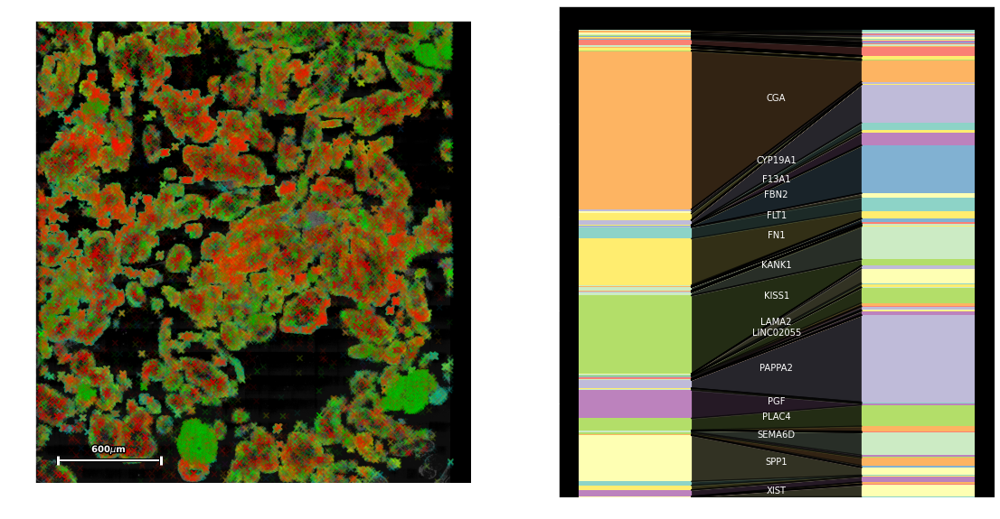

In [13]:
plt.figure(figsize=(19,10))
ax1=plt.subplot(121)

sdata.scatter(alpha=0.1,marker='x',axd=ax1)

plt.subplot(122)
pl.hbar_compare(sdata.stats,sdata.scanpy.stats)

### Functio-structural tissue distinctions:

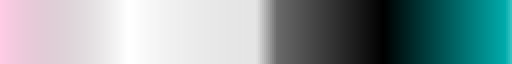

In [14]:
# create colormaps:

color_dict={adata.obs['leiden_subclusters_refined02'].cat.categories[i]:list(matplotlib.colors.to_rgb(adata.uns['leiden_subclusters_refined02_colors'][i])) for i in range(len(adata.uns['leiden_subclusters_refined02_colors']))}

cmap_vct_sct = LinearSegmentedColormap.from_list('clusters', [color_dict['vSCT_1']+[0.5],[0.,0.,0.,0.],[0.5,0.5,0.5,0.2],[0.,0.,0.,5.],color_dict['vVCT']+[0.8]])

cmap_hbc = LinearSegmentedColormap.from_list('clusters', [[0.,0.,0.,0.],[0.,0.,0.,0.],[0.,0.,0.,0.],color_dict['vHBC_prol']+[0.4]])
cmap_vct_sct

In [16]:
# define functional/structural units:
vct_sct = [('vVCT','vVCT_prol'),('vSCT_1','vSCT_2','vSCTjuv')]
HBC = [('vHBC','vHBC_prol',)]

def sigmoid(x): return (1+(-1)/(1+np.exp(x)))

# generate colors per CT:
th_ = -0.5
_th = 0.5

# generate colors per CT:
affinities_vct_sct = sdata.scanpy.score_affinity(*vct_sct, scanpy_obs_label='leiden_subclusters_refined02')*0.3
# affinities_vct_sct/=max(-min(affinities_vct_sct),max(affinities_vct_sct))
affinities_vct_sct[(affinities_vct_sct<_th)&(affinities_vct_sct>th_)]=0.5
affinities_vct_sct[affinities_vct_sct>_th]=1
affinities_vct_sct[affinities_vct_sct<th_]=0
sdata.obsc['affinities_vct'] = affinities_vct_sct
sdata.obsc['c_affinities_vct'] = [list(c) for c in cmap_vct_sct(affinities_vct_sct)]

affinities_hbc = sdata.scanpy.score_affinity(*HBC, scanpy_obs_label='leiden_subclusters_refined02')*0.5
sdata.obsc['affinities_hbc'] = affinities_hbc
sdata.obsc['c_affinities_hbc'] = [list(c) for c in cmap_hbc(affinities_hbc)]

sdata.obsc['colors_final'] = sdata.obsc['c_affinities_vct']
sdata.obsc.loc[sdata.obsc.index[affinities_hbc>2],'colors_final'] = sdata.obsc.loc[sdata.obsc.index[affinities_hbc>2],'c_affinities_hbc']

### Generate UMAP:

In [17]:
# parameters:
bandwidth=9*um_p_px
knn_neighbors=200
n_neighbors=24
min_dist=0.2
metric='euclidean'
random_state=42
zero_weight=1.15

# # parameters:
# bandwidth=5
# knn_neighbors=200
# n_neighbors=24
# min_dist=0.2
# metric='euclidean'
# random_state=42
# zero_weight=2.8


_=sdata.graph.update_knn(n_neighbors=knn_neighbors)

sdata.graph.run_umap(bandwidth=bandwidth,n_neighbors=n_neighbors, min_dist=min_dist, metric=metric, random_state=random_state,zero_weight=zero_weight)


click_coords=np.array((0.0,0.0))
radius=20
folder='-local'
alpha=0.3
alpha_small=0.3
s_large=80
s_small=10

X_=150
Y_=1480
x_=310
y_=2205

width=800
height=1000
width_small=400
height_small=400

_X=(X_+width)
_x=(x_+width_small)
_Y=(Y_+height)
_y=(y_+height_small)


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


This cell is used for interactive exploration of recurring spatial expression patterns. Feel free to un-comment for exploration. To re-create figures, the coordinates used are hard-coded in the remaining notebook.

In [21]:
# plt.figure(figsize=(12,12))

# ax1 = plt.subplot(111)
# sdata.scatter(c=sdata.props.project('colors_final'),s=2,alpha=0.2,axd=ax1)

# scbar = plt.Line2D([0.1,0.9],[0.5,0.5],c='w', marker='|',linewidth=3,
#                   markeredgewidth=3,markersize=10)
# ax1.add_artist(scbar)
# sctxt = ax1.text(0,0,'300μm', fontweight='bold', ha='center' )


# def update_scalebar(length,text=None):
    
#     if text is None: text = f'{length}μm'

#     x_,_x = ax1.get_xlim()
#     y_,_y = ax1.get_ylim()

#     _x_ = _x-x_
#     _y_ = _y-y_

#     new_x_ = x_ + _x_/20
#     new__x =  new_x_+length
#     new_y = y_ + _y_/20
    
#     scbar.set_data([new_x_,new__x],[new_y,new_y])
#     sctxt.set_position(((new_x_+new__x)/2, (y_+_y_/15)))
#     sctxt.set_text(text)

# update_scalebar(1000)
    
# plt.title('156KS global')
# plt.tight_layout()

In [21]:
scbar

In [ ]:
%matplotlib notebook
from matplotlib.backend_bases import MouseButton



plt.style.use('default')

fig = plt.figure(figsize=(11,6))


ax2=plt.subplot(122)
sc3=sdata.graph.plot_umap(c=sdata.obsc.project('colors_final'), text_prop='genes', 
                          alpha=0.03, text_distance=1.1,marker='.',thlds_text=(1.0,0.0015,10000000000))


<IPython.core.display.Javascript object>

Individual sub-plots are created and saved to display the UMAP model in different layouts and for different cell types of interest and stored on disk:

In [28]:
plt.suptitle('')
ax1.set_xticks([],[])
ax1.set_yticks([],[])

ax2.set_xticks([],[])
ax2.set_yticks([],[])

folder='tissue-local'

# sc3.remove()

plt.savefig(f'./output/final-figures/{meta["sample"][1]}/{folder}/{folder}-complete.png',dpi=300)
# plt.savefig(f'./output/final-figures/{meta["sample"][1]}/{folder}/{folder}-no-umap.svg',dpi=300)
plt.savefig(f'./output/final-figures/{meta["sample"][1]}/{folder}/{folder}-complete.pdf',dpi=300)

In [24]:
plt.suptitle('')
ax1.set_xticks([],[])
ax1.set_yticks([],[])

ax2.set_xticks([],[])
ax2.set_yticks([],[])

folder='tissue-local'

sc3.remove()

plt.savefig(f'./output/final-figures/{meta["sample"][1]}/{folder}/{folder}-no-umap.png',dpi=300)
# plt.savefig(f'./output/final-figures/{meta["sample"][1]}/{folder}/{folder}-no-umap.svg',dpi=300)
plt.savefig(f'./output/final-figures/{meta["sample"][1]}/{folder}/{folder}-no-umap.pdf',dpi=300)

In [26]:
#please set text-prop=None in plot_umap

plt.suptitle('')
ax1.set_xticks([],[])
ax1.set_yticks([],[])

ax2.set_xticks([],[])
ax2.set_yticks([],[])

folder='tissue-local'
plt.legend([],[])
# sc3.remove()

plt.savefig(f'./output/final-figures/{meta["sample"][1]}/{folder}/{folder}-no-text.png',dpi=300)
# plt.savefig(f'./output/final-figures/{meta["sample"][1]}/{folder}/{folder}-no-umap.svg',dpi=300)
plt.savefig(f'./output/final-figures/{meta["sample"][1]}/{folder}/{folder}-no-text.pdf',dpi=300)

In [103]:
sc3.remove()

In [22]:
radius=15
click_coords

array([0., 0.])

### Figure tissue-global:

In [23]:
# ax1.set_xlim(0,2400)
# ax1.set_ylim(2650,0)

folder = 'tissue-global'
parent_folder = f'./output/final-figures/{meta["sample"][1]}/{folder}/'

if not os.path.exists(parent_folder):
    os.makedirs(parent_folder)

# update_scalebar(1000,'1mm')
click_coords[:]=(-0.03703789,  5.80666199)
radius = 30
position_circle(click_coords)

plt.savefig(f'./output/final-figures/{meta["sample"][1]}/{folder}/{folder}.png')
plt.savefig(f'./output/final-figures/{meta["sample"][1]}/{folder}/{folder}.svg')

param_df = pd.DataFrame({'x':['bandwidth','knn_neighbors','n_neighbors','min_dist','metric','random_state','zero_weight','radius','circle_x', 'circle_y'],
                         'y':[bandwidth,knn_neighbors,n_neighbors,min_dist,metric,random_state,zero_weight,radius,click_coords[0], click_coords[1]]})

param_df.to_excel(f'./output/final-figures/{meta["sample"][1]}/{folder}/parameters.xlsx')

### Figure tissue-local:

In [29]:
# ax1.set_xlim(400,1000)
# ax1.set_ylim(1500,800)

folder = 'tissue-local'
parent_folder = f'./output/final-figures/{meta["sample"][1]}/{folder}/'

if not os.path.exists(parent_folder):
    os.makedirs(parent_folder)

# update_scalebar(300)
click_coords[:]=(-0.03703789,  5.80666199)
radius = 30
position_circle(click_coords)

plt.savefig(f'./output/final-figures/{meta["sample"][1]}/{folder}/{folder}.png')
plt.savefig(f'./output/final-figures/{meta["sample"][1]}/{folder}/{folder}.svg')

param_df = pd.DataFrame({'x':['bandwidth','knn_neighbors','n_neighbors','min_dist','metric','random_state','zero_weight','radius','circle_x', 'circle_y'],
                         'y':[bandwidth,knn_neighbors,n_neighbors,min_dist,metric,random_state,zero_weight,radius,click_coords[0], click_coords[1]]})

param_df.to_excel(f'./output/final-figures/{meta["sample"][1]}/{folder}/parameters.xlsx')

### Figure walls-global:

In [115]:
# ax1.set_xlim(0,2400)
# ax1.set_ylim(2650,0)

folder = 'walls-global'
parent_folder = f'./output/final-figures/{meta["sample"][1]}/{folder}/'

if not os.path.exists(parent_folder):
    os.makedirs(parent_folder)

# update_scalebar(1000,'1mm')
click_coords[:]=(4.74601063, 20.65023708)
radius = 18
position_circle(click_coords)

plt.savefig(f'./output/final-figures/{meta["sample"][1]}/{folder}/{folder}.png')
plt.savefig(f'./output/final-figures/{meta["sample"][1]}/{folder}/{folder}.svg')

param_df = pd.DataFrame({'x':['bandwidth','knn_neighbors','n_neighbors','min_dist','metric','random_state','zero_weight','radius','circle_x', 'circle_y'],
                         'y':[bandwidth,knn_neighbors,n_neighbors,min_dist,metric,random_state,zero_weight,radius,click_coords[0], click_coords[1]]})

param_df.to_excel(f'./output/final-figures/{meta["sample"][1]}/{folder}/parameters.xlsx')

### Figure walls-local:

In [116]:
# ax1.set_xlim(400,1000)
# ax1.set_ylim(1500,800)

folder = 'walls-local'
parent_folder = f'./output/final-figures/{meta["sample"][1]}/{folder}/'

if not os.path.exists(parent_folder):
    os.makedirs(parent_folder)

# update_scalebar(300)
click_coords[:]=(4.74601063, 20.65023708)
radius = 18
position_circle(click_coords)

plt.savefig(f'./output/final-figures/{meta["sample"][1]}/{folder}/{folder}.png')
plt.savefig(f'./output/final-figures/{meta["sample"][1]}/{folder}/{folder}.svg')

param_df = pd.DataFrame({'x':['bandwidth','knn_neighbors','n_neighbors','min_dist','metric','random_state','zero_weight','radius','circle_x', 'circle_y'],
                         'y':[bandwidth,knn_neighbors,n_neighbors,min_dist,metric,random_state,zero_weight,radius,click_coords[0], click_coords[1]]})

param_df.to_excel(f'./output/final-figures/{meta["sample"][1]}/{folder}/parameters.xlsx')

### Figure intra-global:

In [117]:
# ax1.set_xlim(0,2400)
# ax1.set_ylim(2650,0)

folder = 'intra-global'
parent_folder = f'./output/final-figures/{meta["sample"][1]}/{folder}/'

if not os.path.exists(parent_folder):
    os.makedirs(parent_folder)

# update_scalebar(1000,'1mm')
click_coords[:]=(-6.58226216, -10.25838797)
radius = 15
position_circle(click_coords)

plt.savefig(f'./output/final-figures/{meta["sample"][1]}/{folder}/{folder}.png')
plt.savefig(f'./output/final-figures/{meta["sample"][1]}/{folder}/{folder}.svg')

param_df = pd.DataFrame({'x':['bandwidth','knn_neighbors','n_neighbors','min_dist','metric','random_state','zero_weight','radius','circle_x', 'circle_y'],
                         'y':[bandwidth,knn_neighbors,n_neighbors,min_dist,metric,random_state,zero_weight,radius,click_coords[0], click_coords[1]]})

param_df.to_excel(f'./output/final-figures/{meta["sample"][1]}/{folder}/parameters.xlsx')

### Figure intra-local:

In [118]:
# ax1.set_xlim(400,1000)
# ax1.set_ylim(1500,800)

folder = 'intra-local'
parent_folder = f'./output/final-figures/{meta["sample"][1]}/{folder}/'

if not os.path.exists(parent_folder):
    os.makedirs(parent_folder)

# update_scalebar(300)
click_coords[:]=(-6.58226216, -10.25838797)
radius = 15
position_circle(click_coords)

plt.savefig(f'./output/final-figures/{meta["sample"][1]}/{folder}/{folder}.png')
plt.savefig(f'./output/final-figures/{meta["sample"][1]}/{folder}/{folder}.svg')

param_df = pd.DataFrame({'x':['bandwidth','knn_neighbors','n_neighbors','min_dist','metric','random_state','zero_weight','radius','circle_x', 'circle_y'],
                         'y':[bandwidth,knn_neighbors,n_neighbors,min_dist,metric,random_state,zero_weight,radius,click_coords[0], click_coords[1]]})

param_df.to_excel(f'./output/final-figures/{meta["sample"][1]}/{folder}/parameters.xlsx')

### Figure HBC-global:

In [119]:
# ax1.set_xlim(0,2400)
# ax1.set_ylim(2650,0)

folder = 'hbc-global'
parent_folder = f'./output/final-figures/{meta["sample"][1]}/{folder}/'

if not os.path.exists(parent_folder):
    os.makedirs(parent_folder)

click_coords[:]=(-3.30965002, -6.96571657)
radius = 6
position_circle(click_coords)
# update_scalebar(1000,'1mm')

plt.savefig(f'./output/final-figures/{meta["sample"][1]}/{folder}/{folder}.png')
plt.savefig(f'./output/final-figures/{meta["sample"][1]}/{folder}/{folder}.svg')

param_df = pd.DataFrame({'x':['bandwidth','knn_neighbors','n_neighbors','min_dist','metric','random_state','zero_weight','radius','circle_x', 'circle_y'],
                         'y':[bandwidth,knn_neighbors,n_neighbors,min_dist,metric,random_state,zero_weight,radius,click_coords[0], click_coords[1]]})

param_df.to_excel(f'./output/final-figures/{meta["sample"][1]}/{folder}/parameters.xlsx')

### Figure HBC-local:

In [120]:
# ax1.set_xlim(400,1000)
# ax1.set_ylim(1500,800)

folder = 'hbc-local'
parent_folder = f'./output/final-figures/{meta["sample"][1]}/{folder}/'

if not os.path.exists(parent_folder):
    os.makedirs(parent_folder)

click_coords[:]=(-3.30965002, -6.96571657)
radius = 6
position_circle(click_coords)
# update_scalebar(300)

plt.savefig(f'./output/final-figures/{meta["sample"][1]}/{folder}/{folder}.png')
plt.savefig(f'./output/final-figures/{meta["sample"][1]}/{folder}/{folder}.svg')

param_df = pd.DataFrame({'x':['bandwidth','knn_neighbors','n_neighbors','min_dist','metric','random_state','zero_weight','radius','circle_x', 'circle_y'],
                         'y':[bandwidth,knn_neighbors,n_neighbors,min_dist,metric,random_state,zero_weight,radius,click_coords[0], click_coords[1]]})

param_df.to_excel(f'./output/final-figures/{meta["sample"][1]}/{folder}/parameters.xlsx')

### Figure Cell Columns-global:

In [121]:
# ax1.set_xlim(0,2400)
# ax1.set_ylim(2650,0)

folder = 'columns-global'
parent_folder = f'./output/final-figures/{meta["sample"][1]}/{folder}/'

if not os.path.exists(parent_folder):
    os.makedirs(parent_folder)

click_coords[:]=(-1.96703992,  1.74393035)
radius = 2
position_circle(click_coords)
# update_scalebar(1000,'1mm')

plt.savefig(f'./output/final-figures/{meta["sample"][1]}/{folder}/{folder}.png')
plt.savefig(f'./output/final-figures/{meta["sample"][1]}/{folder}/{folder}.svg')

param_df = pd.DataFrame({'x':['bandwidth','knn_neighbors','n_neighbors','min_dist','metric','random_state','zero_weight','radius','circle_x', 'circle_y'],
                         'y':[bandwidth,knn_neighbors,n_neighbors,min_dist,metric,random_state,zero_weight,radius,click_coords[0], click_coords[1]]})

param_df.to_excel(f'./output/final-figures/{meta["sample"][1]}/{folder}/parameters.xlsx')

### Figure Cell Columns-local:

In [122]:
# ax1.set_xlim(0,2400)
# ax1.set_ylim(2650,0)

folder = 'fn-no-columns-global'
parent_folder = f'./output/final-figures/{meta["sample"][1]}/{folder}/'

if not os.path.exists(parent_folder):
    os.makedirs(parent_folder)

click_coords[:]=(-1.96703992,  1.74393035)
radius = 2
position_circle(click_coords)
# update_scalebar(1000,'1mm')

plt.savefig(f'./output/final-figures/{meta["sample"][1]}/{folder}/{folder}.png')
plt.savefig(f'./output/final-figures/{meta["sample"][1]}/{folder}/{folder}.svg')

param_df = pd.DataFrame({'x':['bandwidth','knn_neighbors','n_neighbors','min_dist','metric','random_state','zero_weight','radius','circle_x', 'circle_y'],
                         'y':[bandwidth,knn_neighbors,n_neighbors,min_dist,metric,random_state,zero_weight,radius,click_coords[0], click_coords[1]]})

param_df.to_excel(f'./output/final-figures/{meta["sample"][1]}/{folder}/parameters.xlsx')

In [123]:
p_x = np.zeros((len(sdata),len(sdata.stats)))

for i,g in enumerate(sdata.genes):
    p_x[:,i]=(sdata.graph.neighbor_types==i).sum(1)

p_x=np.nan_to_num(p_x)
p_x = p_x/p_x.sum(1)[:,None]

H = np.nan_to_num(-p_x * np.log2(p_x)).sum(1)



/home/tiesmeys/anaconda3/envs/ssam/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: divide by zero encountered in log2
  if __name__ == '__main__':
/home/tiesmeys/anaconda3/envs/ssam/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in multiply
  if __name__ == '__main__':


This figure shows the global tissue type modes using UMAP:

<IPython.core.display.Javascript object>


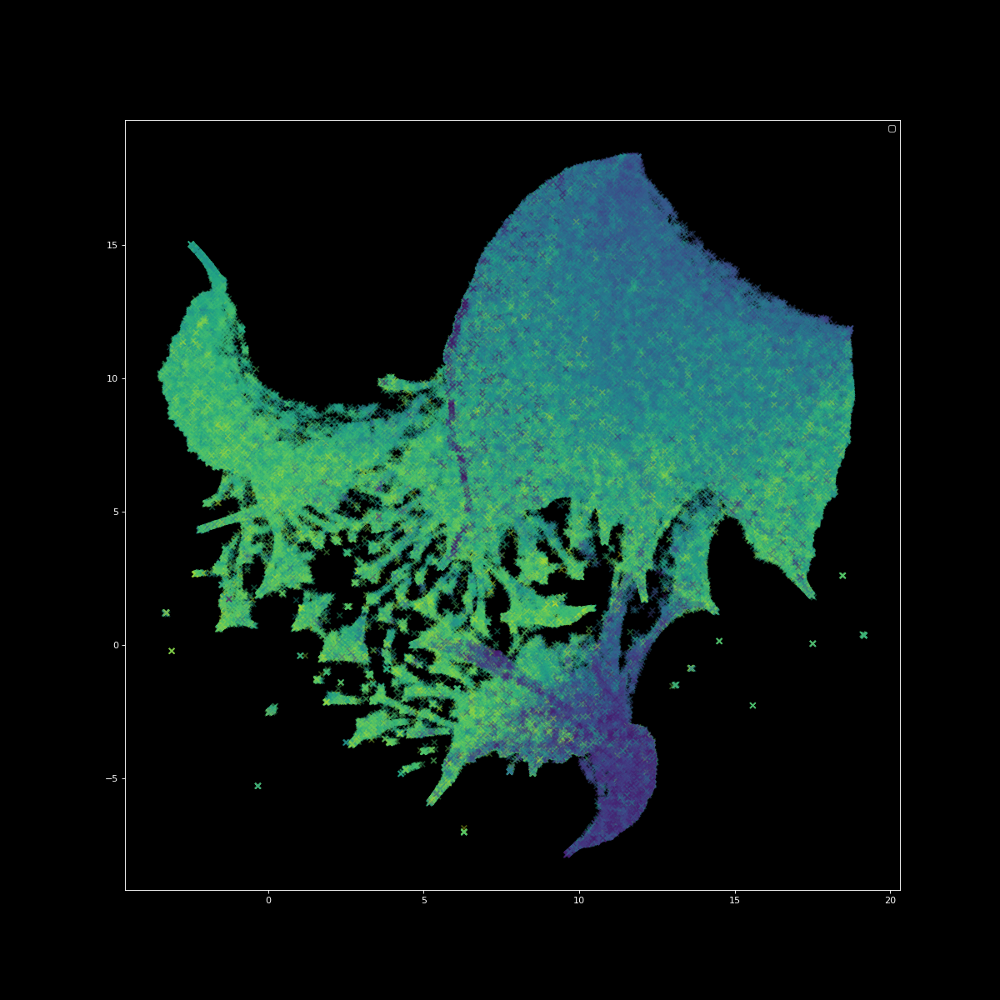

In [24]:
plt.figure(figsize=(15,15))

sdata.graph.plot_umap(c=H,marker='x',alpha=0.4)

plt.legend([],[])

In [143]:
%matplotlib inline

plt.style.use('dark_background')

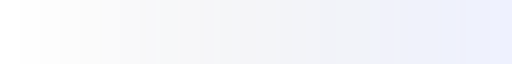

In [135]:
##### create colormaps:



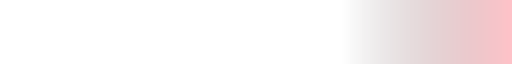

In [256]:
cmap_hbc

In [9]:
%matplotlib inline

import os

plt.style.use('dark_background')

save_root='../output/final-figures/156KS/propositions/proposals-transparent'

if not os.path.exists(save_root):
    os.mkdir(save_root)

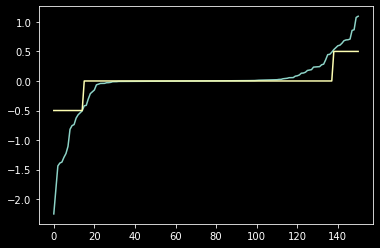

In [10]:
color_dict={adata.obs['leiden_subclusters_refined02'].cat.categories[i]:list(matplotlib.colors.to_rgb(adata.uns['leiden_subclusters_refined02_colors'][i])) for i in range(len(adata.uns['leiden_subclusters_refined02_colors']))}

cmap_vct_sct = LinearSegmentedColormap.from_list('clusters', 
        [color_dict['vSCT_1']+[0.4],[0.6]*3+[0.3],color_dict['vVCT']+[0.4]])
cmap_hbc = LinearSegmentedColormap.from_list('clusters', [[0.,0.,0.,0.],[0.,0.,0.,0.],[0.,0.,0.,0.],color_dict['vHBC']+[0.2]])
cmap_evt = LinearSegmentedColormap.from_list('clusters', [[0.,0.,0.,0.],color_dict['vEVT']+[0.1]])
cmap_evt

# define functional/structural units:
vct_sct = [('vVCT','vVCT_prol'),('vSCT_1','vSCT_2','vSCTjuv')]
HBC = [('vHBC','vHBC_prol',)]

def sigmoid(x): return (1+(-1)/(1+np.exp(x)))

# generate colors per CT:
th_ = -0.5
_th = 0.5

# generate colors per CT:
affinities_vct_sct_ = sdata.scanpy.score_affinity(*vct_sct, scanpy_obs_label='leiden_subclusters_refined02')*0.35
# affinities_vct_sct/=max(-min(affinities_vct_sct),max(affinities_vct_sct))

affinities_vct_sct=affinities_vct_sct_.copy()
affinities_vct_sct[(affinities_vct_sct<_th)&(affinities_vct_sct>th_)]=0.5
affinities_vct_sct[affinities_vct_sct>_th]=1
affinities_vct_sct[affinities_vct_sct<th_]=0
sdata.props['affinities_vct'] = affinities_vct_sct
sdata.props['c_affinities_vct'] = [list(c) for c in cmap_vct_sct(affinities_vct_sct)]

affinities_hbc = sdata.scanpy.score_affinity(*HBC, scanpy_obs_label='leiden_subclusters_refined02')*0.7
sdata.props['affinities_hbc'] = affinities_hbc
sdata.props['c_affinities_hbc'] = [list(c) for c in cmap_hbc(affinities_hbc)]


affinities_evt = sdata.scanpy.score_affinity(['vEVT'], scanpy_obs_label='leiden_subclusters_refined02')*0.9
sdata.props['affinities_evt'] = affinities_evt
sdata.props['c_affinities_evt'] = [list(c) for c in cmap_evt(affinities_evt)]

sdata.props['colors_final'] = sdata.props['c_affinities_vct']
sdata.props.loc[sdata.props.index[affinities_hbc>2],'colors_final'] = sdata.props.loc[sdata.props.index[affinities_hbc>2],'c_affinities_hbc']
sdata.props.loc[sdata.props.index[affinities_evt>2],'colors_final'] = sdata.props.loc[sdata.props.index[affinities_evt>2],'c_affinities_evt']

plt.figure()
plt.plot(np.sort(affinities_vct_sct_))
plt.plot(np.sort(affinities_vct_sct)-0.5)

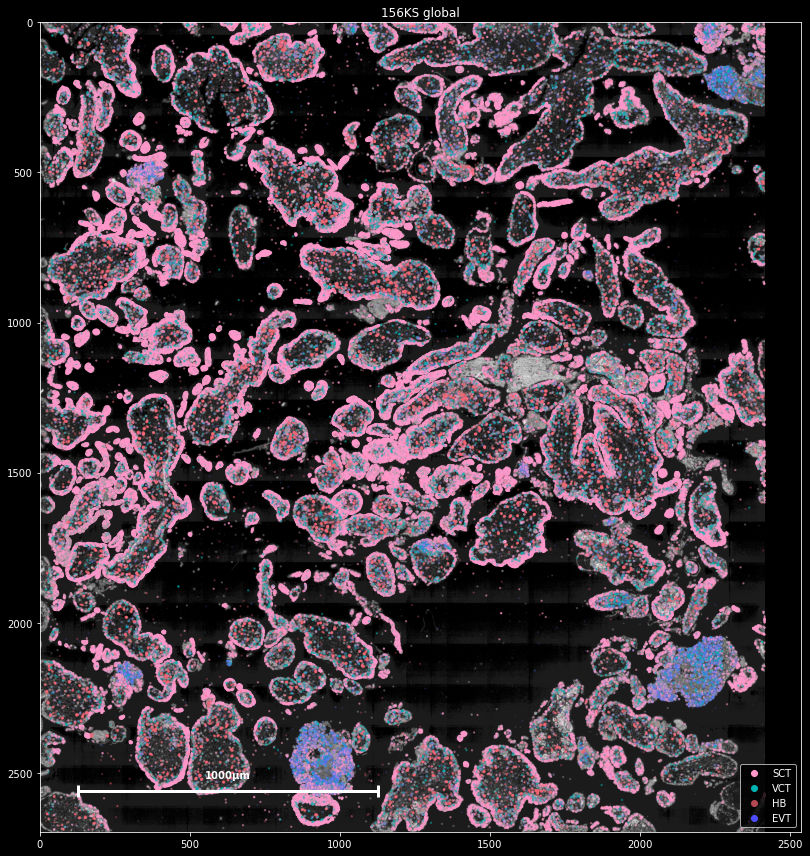

In [11]:
plt.figure(figsize=(12,12))

ax1 = plt.subplot(111)
sdata.scatter(c=sdata.props.project('colors_final'),s=2,axd=ax1)

scbar = plt.Line2D([0.1,0.9],[0.5,0.5],c='w', marker='|',linewidth=3,
                  markeredgewidth=3,markersize=12)
ax1.add_artist(scbar)
sctxt = ax1.text(0,0,'300μm', fontweight='bold', ha='center' )


def update_scalebar(length,text=None):
    
    if text is None: text = f'{length}μm'

    x_,_x = ax1.get_xlim()
    y_,_y = ax1.get_ylim()

    _x_ = _x-x_
    _y_ = _y-y_

    new_x_ = x_ + _x_/20
    new__x =  new_x_+length
    new_y = y_ + _y_/20
    
    scbar.set_data([new_x_,new__x],[new_y,new_y])
    sctxt.set_position(((new_x_+new__x)/2, (y_+_y_/15)))
    sctxt.set_text(text)

update_scalebar(1000)
    
plt.title('156KS global')
plt.tight_layout()



h_vct = plt.scatter([],[],color=cmap_vct_sct(0.0),vmin=0,vmax=1,alpha=1)
h_hbc = plt.scatter([],[],color=cmap_hbc(0.9),vmin=0,vmax=1,alpha=1)
h_sct = plt.scatter([],[],color=cmap_vct_sct(1.0),vmin=0,vmax=1,alpha=1)
h_evt = plt.scatter([],[],color=(0.3,0.3,1.0),vmin=0,vmax=1)
plt.legend([h_vct,h_sct,h_hbc,h_evt],['SCT','VCT','HB','EVT'])

plt.savefig(f'{save_root}/156KS-global.png')

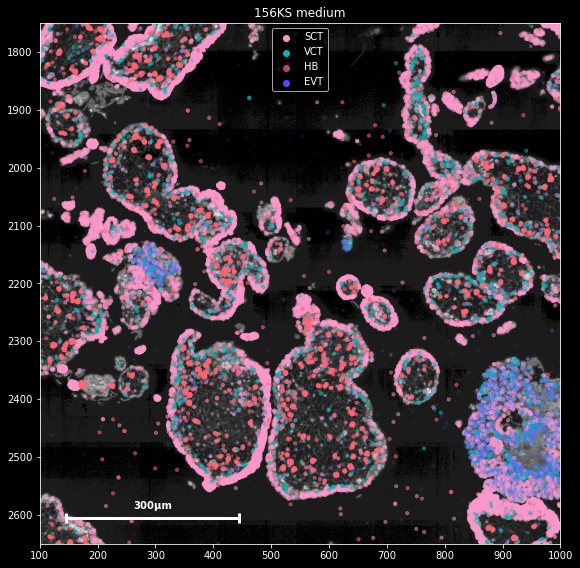

In [15]:

positions='''x_=0;y_=0
x_=100;y_=1750
x_=100;y_=1400
x_=1000;y_=0'''

positions='''x_=100;y_=1750'''

for position in positions.split('\n'):
    
    exec(position)
    
    plt.figure(figsize=(8,8))

    ax1 = plt.subplot(111)
    sdata.scatter(c=sdata.props.project('colors_final'),s=10,axd=ax1)

    scbar = plt.Line2D([0.1,0.9],[0.5,0.5],c='w', marker='|',linewidth=3,
                      markeredgewidth=3,markersize=10)
    ax1.add_artist(scbar)
    sctxt = ax1.text(0,0,'300μm', fontweight='bold', ha='center' )

    plt.xlim(x_,x_+900)
    plt.ylim(y_+900,y_,)

    def update_scalebar(length,text=None):

        if text is None: text = f'{length}μm'

        x_,_x = ax1.get_xlim()
        y_,_y = ax1.get_ylim()

        _x_ = _x-x_
        _y_ = _y-y_

        new_x_ = x_ + _x_/20
        new__x =  new_x_+length
        new_y = y_ + _y_/20

        scbar.set_data([new_x_,new__x],[new_y,new_y])
        sctxt.set_position(((new_x_+new__x)/2, (y_+_y_/15)))
        sctxt.set_text(text)

    update_scalebar(300)

    plt.title('156KS medium')
    plt.tight_layout()
    
    h_vct = plt.scatter([],[],color=cmap_vct_sct(0.0),vmin=0,vmax=1,alpha=1)
    h_hbc = plt.scatter([],[],color=cmap_hbc(0.9),vmin=0,vmax=1,alpha=1)
    h_sct = plt.scatter([],[],color=cmap_vct_sct(1.0),vmin=0,vmax=1,alpha=1)
    h_evt = plt.scatter([],[],color=(0.3,0.3,1.0),vmin=0,vmax=1)
    plt.legend([h_vct,h_sct,h_hbc,h_evt],['SCT','VCT','HB','EVT'])
    
    plt.savefig(f'{save_root}/156KS-wide-{x_}-{y_}.png')
    
#     break

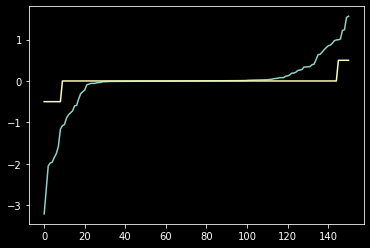

In [68]:
color_dict={adata.obs['leiden_subclusters_refined02'].cat.categories[i]:list(matplotlib.colors.to_rgb(adata.uns['leiden_subclusters_refined02_colors'][i])) for i in range(len(adata.uns['leiden_subclusters_refined02_colors']))}

cmap_vct_sct = LinearSegmentedColormap.from_list('clusters', 
         [color_dict['vSCT_1']+[0.45],[0.7]*3+[0.3],color_dict['vVCT']+[0.5]])
cmap_hbc = LinearSegmentedColormap.from_list('clusters', [[0.,0.,0.,0.],[0.,0.,0.,0.],[0.,0.,0.,0.],color_dict['vHBC']+[0.5]])
cmap_evt = LinearSegmentedColormap.from_list('clusters', [[0.,0.,0.,0.],color_dict['vEVT']+[0.1]])
cmap_evt

# define functional/structural units:
vct_sct = [('vVCT','vVCT_prol'),('vSCT_1','vSCT_2','vSCTjuv')]
HBC = [('vHBC','vHBC_prol',)]

def sigmoid(x): return (1+(-1)/(1+np.exp(x)))

# generate colors per CT:
th_ = -0.5
_th = 0.5

# generate colors per CT:
affinities_vct_sct_ = sdata.scanpy.score_affinity(*vct_sct, scanpy_obs_label='leiden_subclusters_refined02')*0.5
affinities_vct = sdata.scanpy.score_affinity(vct_sct[0], scanpy_obs_label='leiden_subclusters_refined02')
affinities_sct = sdata.scanpy.score_affinity(vct_sct[1], scanpy_obs_label='leiden_subclusters_refined02')

affinities_vct_sct = affinities_vct_sct_*0+0.5
affinities_vct_sct[affinities_vct>1.5]=1
affinities_vct_sct[affinities_sct>1.5]=0


# affinities_vct_sct/=max(-min(affinities_vct_sct),max(affinities_vct_sct))

# affinities_vct_sct=affinities_vct_sct_.copy()
# affinities_vct_sct[(affinities_vct_sct<_th)&(affinities_vct_sct>th_)]=0.5
# affinities_vct_sct[affinities_vct_sct>_th]=1
# affinities_vct_sct[affinities_vct_sct<th_]=0
sdata.props['affinities_vct'] = affinities_vct_sct
sdata.props['c_affinities_vct'] = [list(c) for c in cmap_vct_sct(affinities_vct_sct)]

affinities_hbc = sdata.scanpy.score_affinity(*HBC, scanpy_obs_label='leiden_subclusters_refined02')*0.7
sdata.props['affinities_hbc'] = affinities_hbc
sdata.props['c_affinities_hbc'] = [list(c) for c in cmap_hbc(affinities_hbc)]


affinities_evt = sdata.scanpy.score_affinity(['vEVT'], scanpy_obs_label='leiden_subclusters_refined02')*0.9
sdata.props['affinities_evt'] = affinities_evt
sdata.props['c_affinities_evt'] = [list(c) for c in cmap_evt(affinities_evt)]

sdata.props['colors_final'] = sdata.props['c_affinities_vct']
sdata.props.loc[sdata.props.index[affinities_hbc>2],'colors_final'] = sdata.props.loc[sdata.props.index[affinities_hbc>2],'c_affinities_hbc']
sdata.props.loc[sdata.props.index[affinities_evt>2],'colors_final'] = sdata.props.loc[sdata.props.index[affinities_evt>2],'c_affinities_evt']

plt.figure()
plt.plot(np.sort(affinities_vct_sct_))
plt.plot(np.sort(affinities_vct_sct)-0.5)

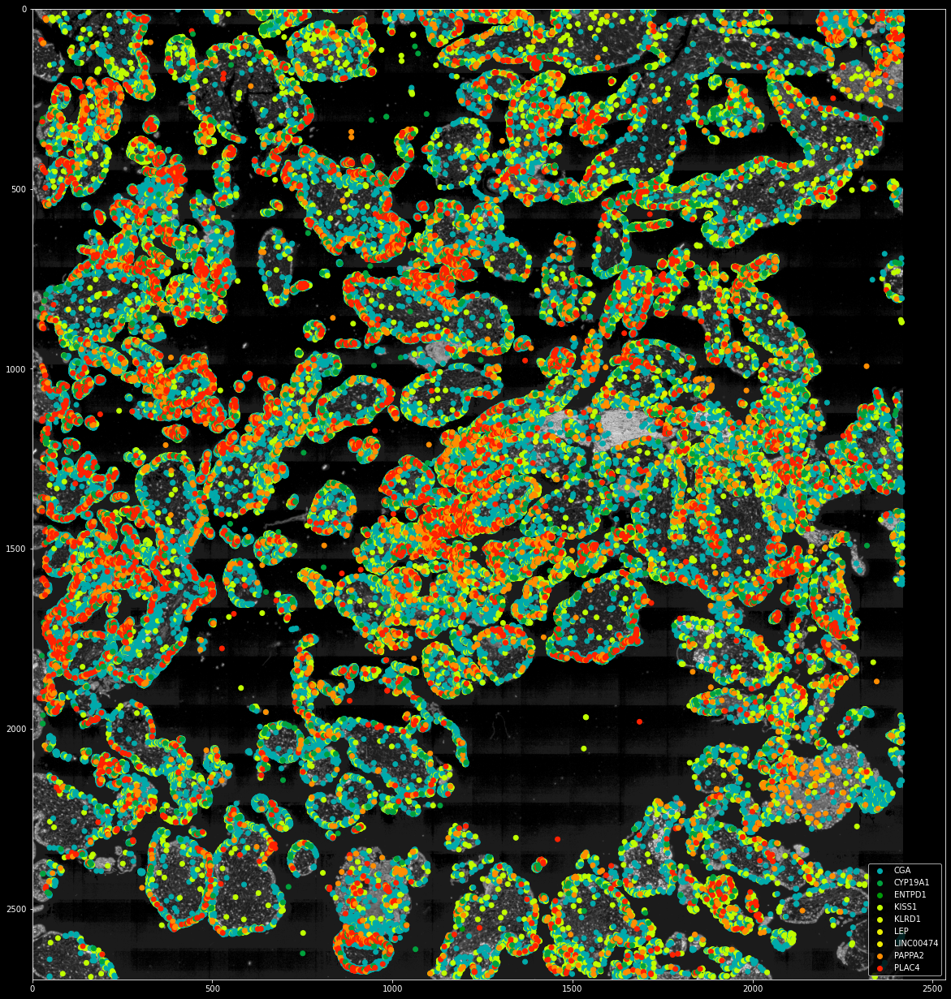

In [71]:
plt.figure(figsize=(22,22))

# sdata[sdata.g=='SLC1A2'].scatter(legend=True)
sdata[sdata.props.project('affinities_vct')==0].scatter(legend=True)

# plt.xlim(x_,x_+1000)
# plt.ylim(y_-1000,y_,)

In [70]:
sdata.genes[np.argsort(affinities_vct_sct_)][-10:]

Index(['ASPM', 'CD24', 'FBN2', 'TIMP3', 'BRIP1', 'ATAD2', 'DIAPH3', 'CDH1',
       'KANK1', 'SEMA6D'],
      dtype='object')

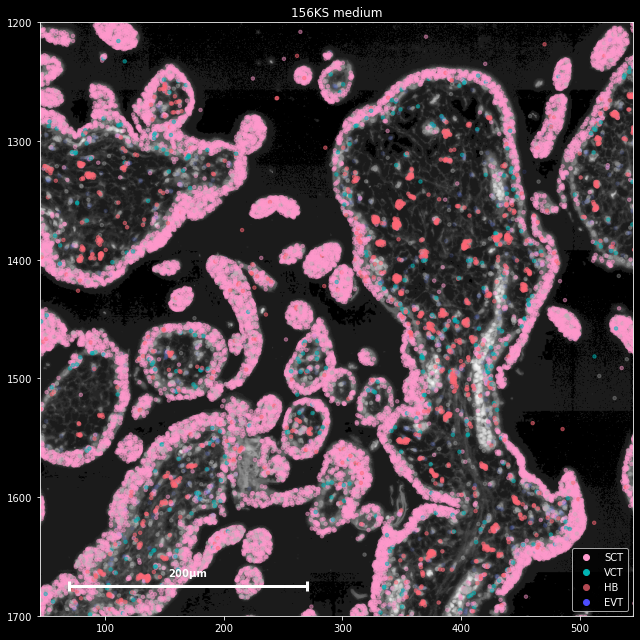

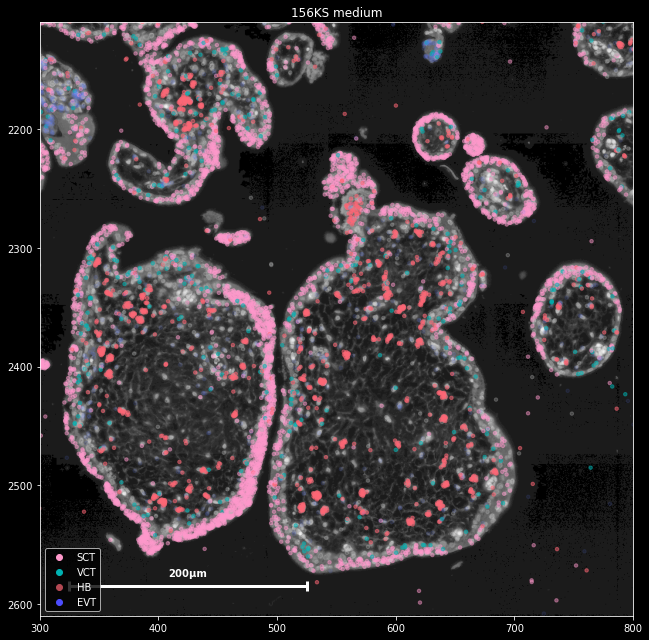

In [35]:

positions='''x_=0;y_=0
x_=300;y_=2110
x_=0;y_=1200
x_=1000;y_=0'''

positions='''x_=45;y_=1200
x_=300;y_=2110'''


for position in positions.split('\n'):
    
    exec(position)
    
    plt.figure(figsize=(9,9))
    ax1 = plt.subplot(111)
    sdata.scatter(c=sdata.props.project('colors_final'),s=12, axd=ax1,marker='o')

    scbar = plt.Line2D([0.1,0.9],[0.5,0.5],c='w', marker='|',linewidth=3,
                      markeredgewidth=3,markersize=10)
    ax1.add_artist(scbar)
    sctxt = ax1.text(0,0,'300μm', fontweight='bold', ha='center' )

    plt.xlim(x_,x_+500)
    plt.ylim(y_+500,y_,)

    def update_scalebar(length,text=None):

        if text is None: text = f'{length}μm'

        x_,_x = ax1.get_xlim()
        y_,_y = ax1.get_ylim()

        _x_ = _x-x_
        _y_ = _y-y_

        new_x_ = x_ + _x_/20
        new__x =  new_x_+length
        new_y = y_ + _y_/20

        scbar.set_data([new_x_,new__x],[new_y,new_y])
        sctxt.set_position(((new_x_+new__x)/2, (y_+_y_/15)))
        sctxt.set_text(text)

    update_scalebar(200)

    plt.title('156KS medium')
    plt.tight_layout()
    
    h_vct = plt.scatter([],[],color=cmap_vct_sct(0.0),vmin=0,vmax=1,alpha=1)
    h_hbc = plt.scatter([],[],color=cmap_hbc(0.9),vmin=0,vmax=1,alpha=1)
    h_sct = plt.scatter([],[],color=cmap_vct_sct(1.0),vmin=0,vmax=1,alpha=1)
    h_evt = plt.scatter([],[],color=(0.3,0.3,1.0),vmin=0,vmax=1)
    plt.legend([h_vct,h_sct,h_hbc,h_evt],['SCT','VCT','HB','EVT'],)
    
    plt.savefig(f'{save_root}/156KS-medium-{x_}-{y_}.png')
    
    
#     break

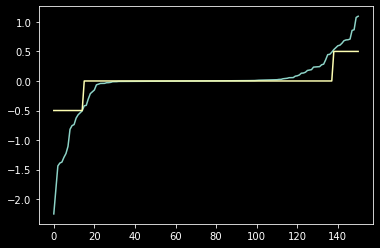

In [23]:
# color_dict={adata.obs['leiden_subclusters_refined02'].cat.categories[i]:list(matplotlib.colors.to_rgb(adata.uns['leiden_subclusters_refined02_colors'][i])) for i in range(len(adata.uns['leiden_subclusters_refined02_colors']))}

cmap_vct_sct = LinearSegmentedColormap.from_list('clusters', 
         [color_dict['vSCT_1']+[0.7],[0.7]*3+[0.3],color_dict['vVCT']+[0.7]])
cmap_hbc = LinearSegmentedColormap.from_list('clusters', [[0.,0.,0.,0.],[0.,0.,0.,0.],[0.,0.,0.,0.],color_dict['vHBC']+[0.4]])
cmap_evt = LinearSegmentedColormap.from_list('clusters', [[0.,0.,0.,0.],color_dict['vEVT']+[0.1]])
cmap_evt

# define functional/structural units:
vct_sct = [('vVCT','vVCT_prol'),('vSCT_1','vSCT_2','vSCTjuv')]
HBC = [('vHBC','vHBC_prol',)]

def sigmoid(x): return (1+(-1)/(1+np.exp(x)))

# generate colors per CT:
th_ = -0.5
_th = 0.5

# generate colors per CT:
affinities_vct_sct_ = sdata.scanpy.score_affinity(*vct_sct, scanpy_obs_label='leiden_subclusters_refined02')*0.35
# affinities_vct_sct/=max(-min(affinities_vct_sct),max(affinities_vct_sct))

affinities_vct_sct=affinities_vct_sct_.copy()
affinities_vct_sct[(affinities_vct_sct<_th)&(affinities_vct_sct>th_)]=0.5
affinities_vct_sct[affinities_vct_sct>_th]=1
affinities_vct_sct[affinities_vct_sct<th_]=0
sdata.props['affinities_vct'] = affinities_vct_sct
sdata.props['c_affinities_vct'] = [list(c) for c in cmap_vct_sct(affinities_vct_sct)]

affinities_hbc = sdata.scanpy.score_affinity(*HBC, scanpy_obs_label='leiden_subclusters_refined02')*0.7
sdata.props['affinities_hbc'] = affinities_hbc
sdata.props['c_affinities_hbc'] = [list(c) for c in cmap_hbc(affinities_hbc)]


affinities_evt = sdata.scanpy.score_affinity(['vEVT'], scanpy_obs_label='leiden_subclusters_refined02')*0.9
sdata.props['affinities_evt'] = affinities_evt
sdata.props['c_affinities_evt'] = [list(c) for c in cmap_evt(affinities_evt)]

sdata.props['colors_final'] = sdata.props['c_affinities_vct']
sdata.props.loc[sdata.props.index[affinities_hbc>2],'colors_final'] = sdata.props.loc[sdata.props.index[affinities_hbc>2],'c_affinities_hbc']
sdata.props.loc[sdata.props.index[affinities_evt>2],'colors_final'] = sdata.props.loc[sdata.props.index[affinities_evt>2],'c_affinities_evt']

plt.figure()
plt.plot(np.sort(affinities_vct_sct_))
plt.plot(np.sort(affinities_vct_sct)-0.5)

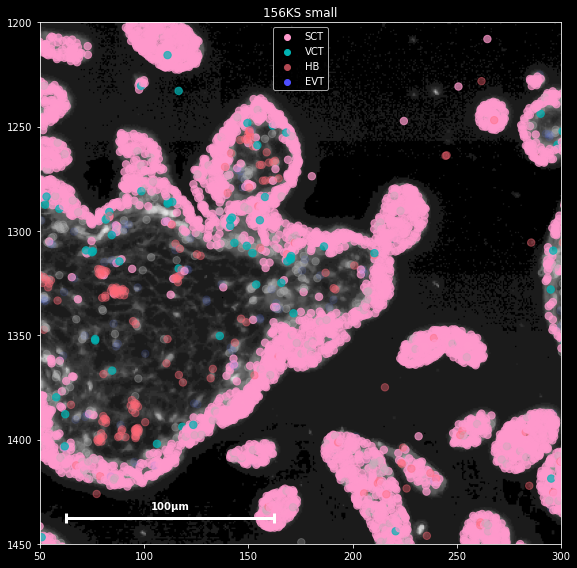

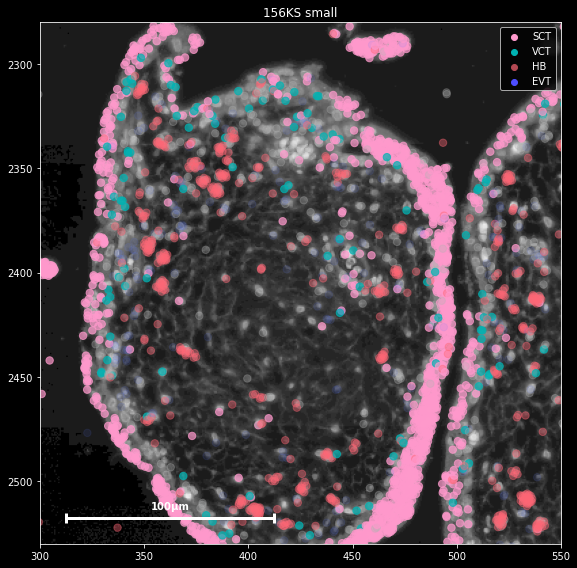

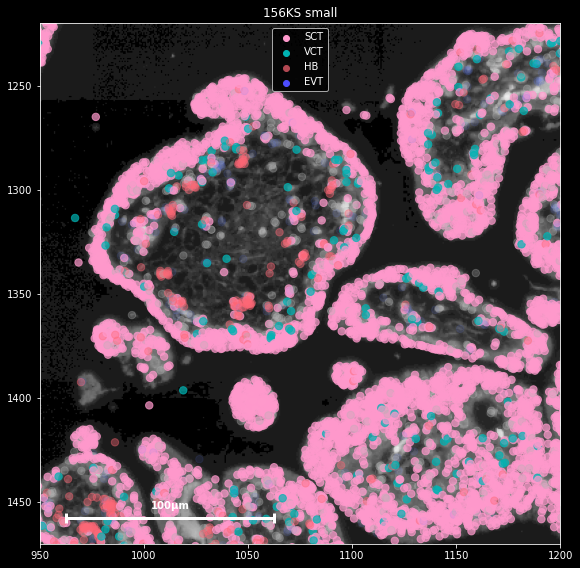

In [24]:


positions = '''x_=100;y_=200
x_=300;y_=2280
x_=50;y_=1200
x_=1060;y_=0
x_=610;y_=1930
x_=950;y_=1220
x_=720;y_=1300'''

positions = '''x_=50;y_=1200
x_=300;y_=2280
x_=950;y_=1220'''

for position in positions.split('\n'):
    
    exec(position)

    plt.figure(figsize=(8,8))
    ax1 = plt.subplot(111)
    sdata.scatter(c=sdata.props.project('colors_final'),s=55, axd=ax1)

    scbar = plt.Line2D([0.1,0.9],[0.5,0.5],c='w', marker='|',linewidth=3,
                      markeredgewidth=3,markersize=10)
    ax1.add_artist(scbar)
    sctxt = ax1.text(0,0,'300μm', fontweight='bold', ha='center' )

    plt.xlim(x_,x_+250)
    plt.ylim(y_+250,y_,)

    def update_scalebar(length,text=None):

        if text is None: text = f'{length}μm'

        x_,_x = ax1.get_xlim()
        y_,_y = ax1.get_ylim()

        _x_ = _x-x_
        _y_ = _y-y_

        new_x_ = x_ + _x_/20
        new__x =  new_x_+length
        new_y = y_ + _y_/20

        scbar.set_data([new_x_,new__x],[new_y,new_y])
        sctxt.set_position(((new_x_+new__x)/2, (y_+_y_/15)))
        sctxt.set_text(text)

    update_scalebar(100)

    plt.title('156KS small')
    plt.tight_layout()
    
    h_vct = plt.scatter([],[],color=cmap_vct_sct(0.0),vmin=0,vmax=1,alpha=1)
    h_hbc = plt.scatter([],[],color=cmap_hbc(0.9),vmin=0,vmax=1,alpha=1)
    h_sct = plt.scatter([],[],color=cmap_vct_sct(1.0),vmin=0,vmax=1,alpha=1)
    h_evt = plt.scatter([],[],color=(0.3,0.3,1.0),vmin=0,vmax=1)
    plt.legend([h_vct,h_sct,h_hbc,h_evt],['SCT','VCT','HB','EVT'])
    
    plt.savefig(f'{save_root}/156KS-narrow-{x_}-{y_}.png')
#     break